In [1]:
from pandas_datareader import data, wb
import pandas as pd
import numpy as np
import datetime
import yfinance as yf
%matplotlib inline

In [2]:
start = datetime.datetime(2014, 1, 1)
end = datetime.datetime(2024, 12,1)

In [3]:
# HDFC Bank
HDFCBANK = yf.download("HDFCBANK.NS", start=start, end=end)

# State Bank of India Bank
SBI = yf.download("SBIN.NS", start=start,end=end)

# ICICI Bank
ICICIBANK = yf.download("ICICIBANK.NS", start=start, end=end)

# Axis Bank
AXISBANK = yf.download("AXISBANK.NS", start=start, end=end)

# IDBI Bank
IDBI = yf.download("IDBI.NS", start=start, end=end)

# Kotak Mahindra Bank
KOTAKBANK = yf.download("KOTAKBANK.NS", start=start,end=end)

#Bank of India
BANKINDIA = yf.download("BANKINDIA.NS", start=start, end=end)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [4]:
tickers = ['HDFCBANK.NS','SBIN.NS','ICICIBANK.NS','AXISBANK.NS','IDBI.NS','KOTAKBANK.NS','BANKINDIA.NS']

In [5]:
bank_stocks = pd.concat([HDFCBANK,SBI,ICICIBANK,AXISBANK,IDBI,KOTAKBANK,BANKINDIA], keys=tickers, axis=1)
bank_stocks.head()

HDFCBANK.NS                                                  \
Price        Adj Close       Close        High         Low        Open   
Ticker     HDFCBANK.NS HDFCBANK.NS HDFCBANK.NS HDFCBANK.NS HDFCBANK.NS   
Date                                                                     
2014-01-01  305.065796  332.575012  334.899994  331.500000  334.000000   
2014-01-02  301.327820  328.500000  337.375000  326.774994  332.500000   
2014-01-03  304.125519  331.549988  333.000000  325.000000  326.000000   
2014-01-06  303.483398  330.850006  331.500000  328.500000  331.500000   
2014-01-07  304.721771  332.200012  335.475006  326.649994  333.549988   

                           SBIN.NS                                      ...  \
Price           Volume   Adj Close       Close        High         Low  ...   
Ticker     HDFCBANK.NS     SBIN.NS     SBIN.NS     SBIN.NS     SBIN.NS  ...   
Date                                                                    ...   
2014-01-01     2246218  158.148178  176.505005  177.490005  176.125000  ...   
2014-01-02     3614496  156.136673  174.259995  180.600006  173.220001  ...   
2014-01-03     3256592  154.080368  171.964996  173.600006  171.100006  ...   
2014-01-06     2981710  151.257965  168.815002  172.399994  168.199997  ...   
2014-01-07     3948460  148.861176  166.139999  170.199997  165.500000  ...   

           KOTAKBANK.NS                                        BANKINDIA.NS  \
Price              High          Low         Open       Volume    Adj Close   
Ticker     KOTAKBANK.NS KOTAKBANK.NS KOTAKBANK.NS KOTAKBANK.NS BANKINDIA.NS   
Date                                                                          
2014-01-01   366.024994   360.375000   366.000000       785536   211.109863   
2014-01-02   365.725006   351.500000   361.299988       912278   204.945435   
2014-01-03   358.149994   348.299988   353.549988      1145134   208.461761   
2014-01-06   358.500000   352.799988   355.000000       893430   201.733002   
2014-01-07   357.500000   350.000000   356.000000      1287588   200.560883   

                                                                             
Price             Close         High          Low         Open       Volume  
Ticker     BANKINDIA.NS BANKINDIA.NS BANKINDIA.NS BANKINDIA.NS BANKINDIA.NS  
Date                                                                         
2014-01-01   243.149994   246.000000   237.050003   239.000000      2230865  
2014-01-02   236.050003   251.300003   234.399994   244.899994      6453238  
2014-01-03   240.100006   241.050003   231.899994   233.949997      3726614  
2014-01-06   232.350006   240.899994   230.050003   240.000000      2935346  
2014-01-07   231.000000   235.000000   225.649994   232.050003      3514992  

[5 rows x 42 columns]

# EDA

In [6]:
# Max close price of each bank stock throughout the time period
bank_stocks.xs(key='Close', axis=1, level='Price').max()

              Ticker      
HDFCBANK.NS   HDFCBANK.NS     1812.300049
SBIN.NS       SBIN.NS          905.650024
ICICIBANK.NS  ICICIBANK.NS    1338.449951
AXISBANK.NS   AXISBANK.NS     1317.300049
IDBI.NS       IDBI.NS          112.699997
KOTAKBANK.NS  KOTAKBANK.NS    2210.949951
BANKINDIA.NS  BANKINDIA.NS     344.700012
dtype: float64

returns are typically defined by:**

$$r_t = \frac{p_t - p_{t-1}}{p_{t-1}} = \frac{p_t}{p_{t-1}} - 1$$

In [7]:
returns = pd.DataFrame()

** We can use pandas pct_change() method on the Close column to create a column representing this return value. Create a for loop that goes and for each Bank Stock Ticker creates this returns column and set's it as a column in the returns DataFrame.**

In [8]:
for t in tickers:
    returns[t+ 'return'] = bank_stocks[t]['Close'].pct_change()

In [10]:
returns.head()

,HDFCBANK.NSreturn,SBIN.NSreturn,ICICIBANK.NSreturn,AXISBANK.NSreturn,IDBI.NSreturn,KOTAKBANK.NSreturn,BANKINDIA.NSreturn
Date,,,,,,,
2014-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-02,-0.012253,-0.012719,-0.020133,-0.015400,-0.029586,-0.020967,-0.029200
2014-01-03,0.009285,-0.013170,-0.008181,-0.008960,0.008384,0.007280,0.017157
2014-01-06,-0.002111,-0.018318,-0.024372,-0.003648,-0.009070,0.002175,-0.032278
2014-01-07,0.004080,-0.015846,0.008839,-0.017551,-0.019832,-0.008332,-0.005810


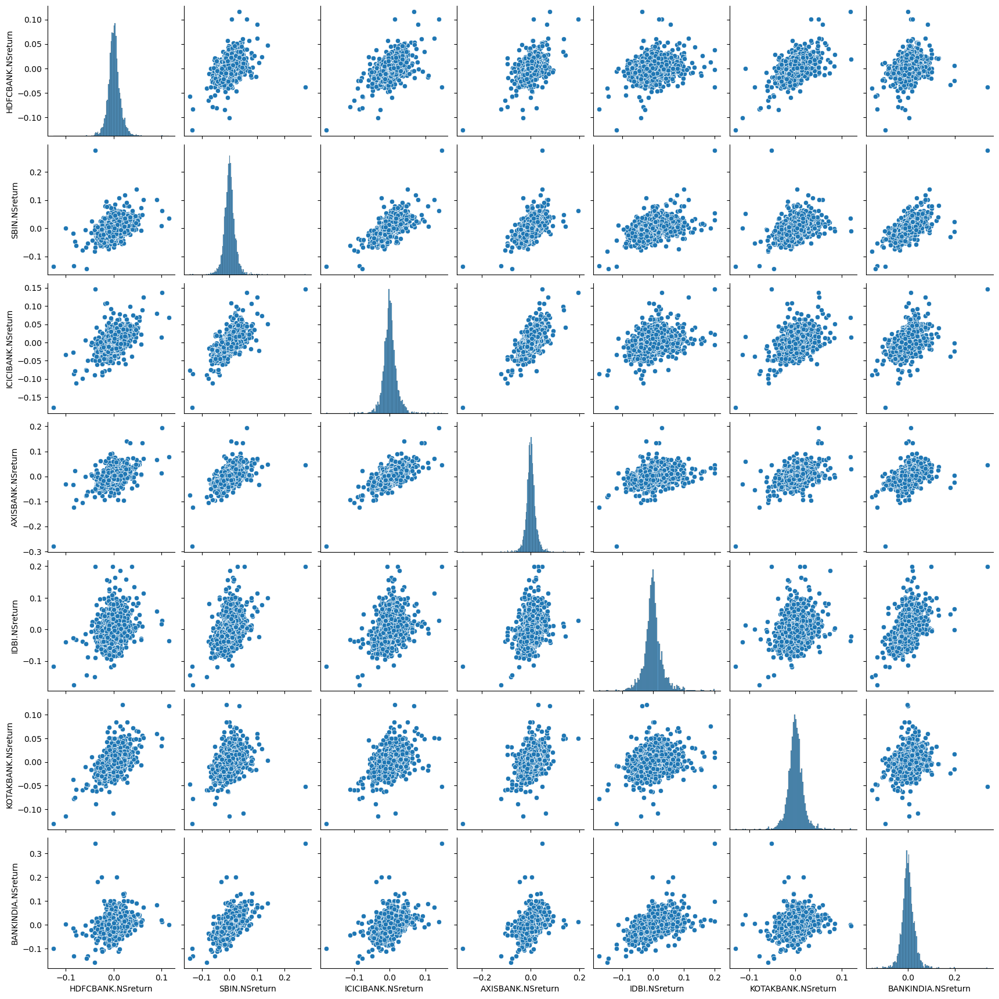

In [12]:
import seaborn as sns
sns.pairplot(returns[1:])

In [13]:
returns.idxmin()

HDFCBANK.NSreturn    2020-03-23
SBIN.NSreturn        2024-06-04
ICICIBANK.NSreturn   2020-03-23
AXISBANK.NSreturn    2020-03-23
IDBI.NSreturn        2020-03-12
KOTAKBANK.NSreturn   2020-03-23
BANKINDIA.NSreturn   2015-08-24
dtype: datetime64[ns]

### HDFC, ICICI, AXIS, KOTAK have lowest return on same date.

In [14]:
returns.min()

HDFCBANK.NSreturn    -0.126069
SBIN.NSreturn        -0.144040
ICICIBANK.NSreturn   -0.178478
AXISBANK.NSreturn    -0.279108
IDBI.NSreturn        -0.175097
KOTAKBANK.NSreturn   -0.129996
BANKINDIA.NSreturn   -0.157057
dtype: float64

In [16]:
returns.idxmax()

HDFCBANK.NSreturn    2020-03-25
SBIN.NSreturn        2017-10-25
ICICIBANK.NSreturn   2017-10-25
AXISBANK.NSreturn    2020-04-07
IDBI.NSreturn        2017-10-25
KOTAKBANK.NSreturn   2020-10-27
BANKINDIA.NSreturn   2017-10-25
dtype: datetime64[ns]

### SBI, ICICI, IDBI, BANKINDIA have same highest return on same date.

In [17]:
returns.max()

HDFCBANK.NSreturn     0.115996
SBIN.NSreturn         0.276872
ICICIBANK.NSreturn    0.146877
AXISBANK.NSreturn     0.194807
IDBI.NSreturn         0.199816
KOTAKBANK.NSreturn    0.120510
BANKINDIA.NSreturn    0.341160
dtype: float64

In [18]:
returns.std()

HDFCBANK.NSreturn     0.014183
SBIN.NSreturn         0.021220
ICICIBANK.NSreturn    0.019702
AXISBANK.NSreturn     0.020982
IDBI.NSreturn         0.030032
KOTAKBANK.NSreturn    0.016693
BANKINDIA.NSreturn    0.028205
dtype: float64

In [22]:
returns.loc['2024, 1,1':'2024, 11,30'].std()

HDFCBANK.NSreturn     0.014460
SBIN.NSreturn         0.018988
ICICIBANK.NSreturn    0.013401
AXISBANK.NSreturn     0.015940
IDBI.NSreturn         0.028766
KOTAKBANK.NSreturn    0.015090
BANKINDIA.NSreturn    0.024249
dtype: float64

### Low std means low risk and high std means high risk

C:\Users\Palak Kapahi\AppData\Local\Temp\ipykernel_18448\2058513000.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(returns.loc['2024, 1,1':'2024, 11,30']['IDBI.NSreturn'])


<Axes: xlabel='IDBI.NSreturn', ylabel='Density'>

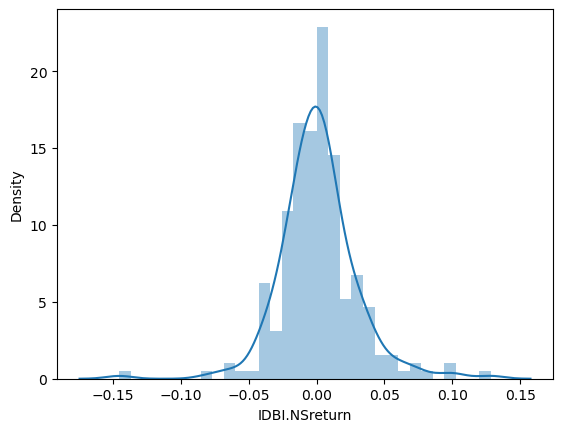

In [24]:
sns.distplot(returns.loc['2024, 1,1':'2024, 11,30']['IDBI.NSreturn'])

C:\Users\Palak Kapahi\AppData\Local\Temp\ipykernel_18448\2280733332.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(returns.loc['2024, 1,1':'2024, 11,30']['ICICIBANK.NSreturn'])


<Axes: xlabel='ICICIBANK.NSreturn', ylabel='Density'>

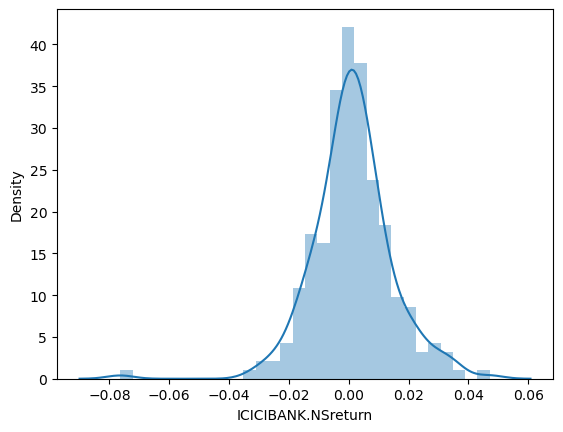

In [25]:
sns.distplot(returns.loc['2024, 1,1':'2024, 11,30']['ICICIBANK.NSreturn'])

In [29]:
import plotly
import cufflinks as cf
import matplotlib.pyplot as plt
cf.go_offline()

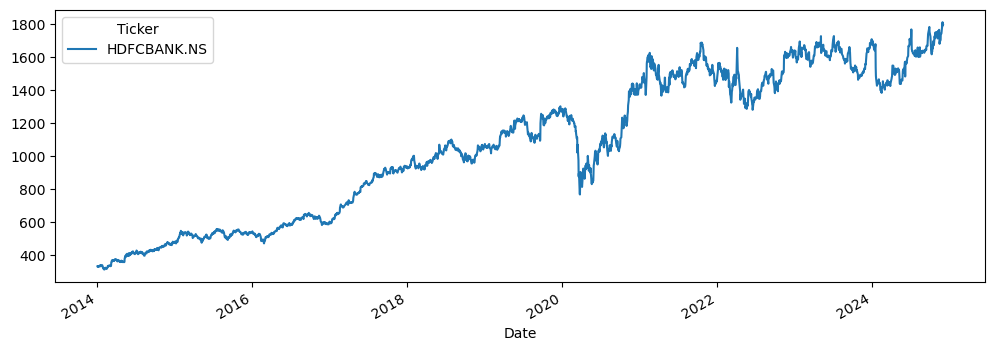

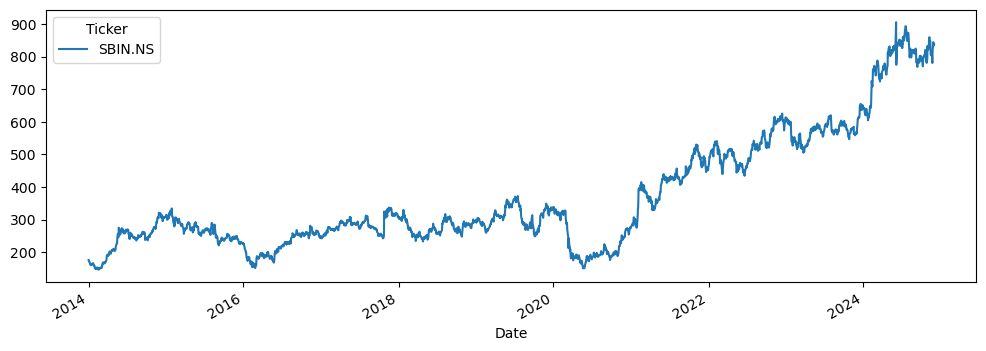

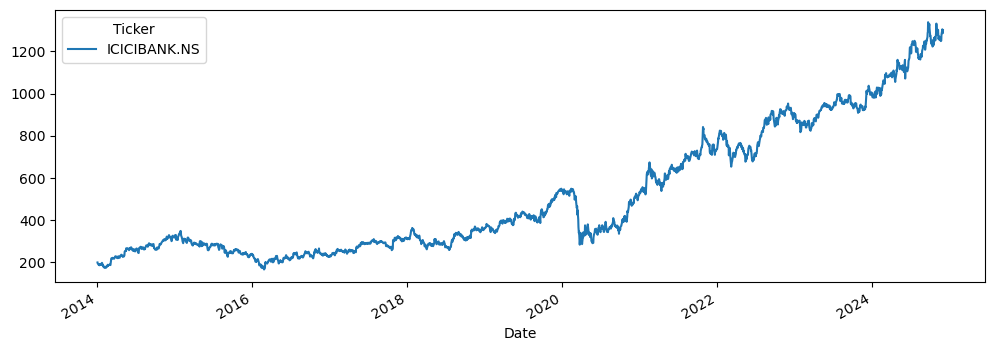

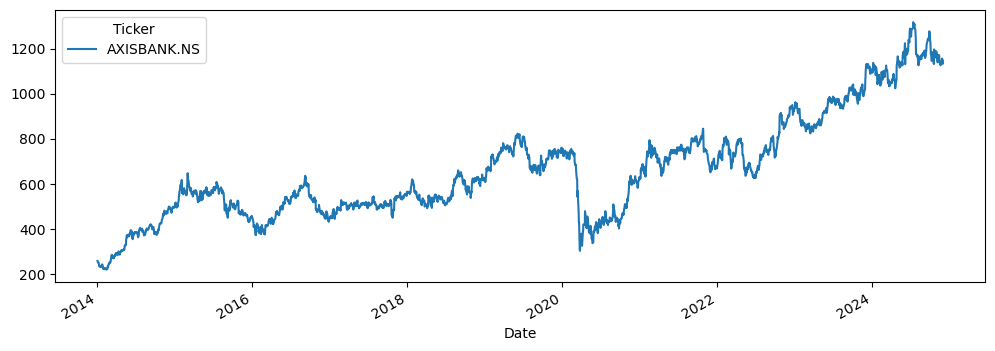

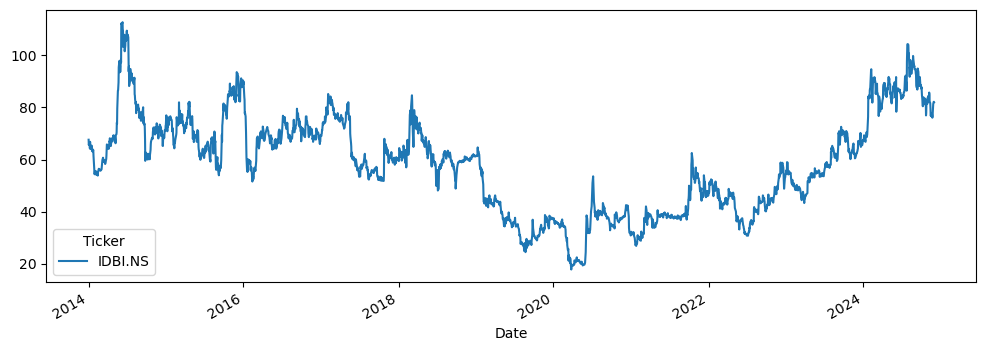

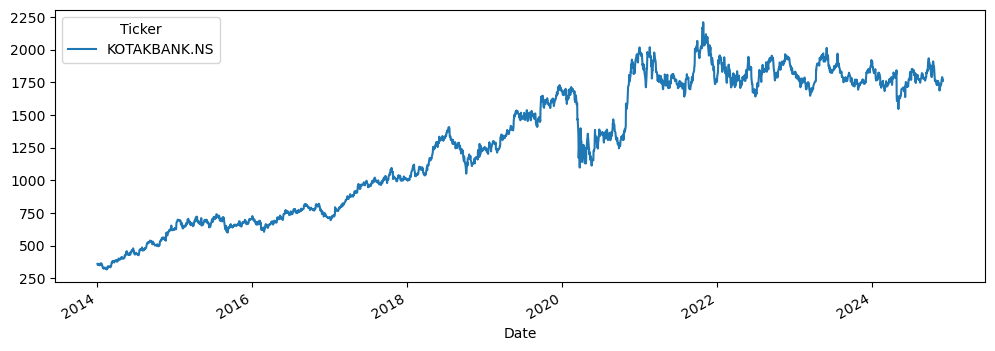

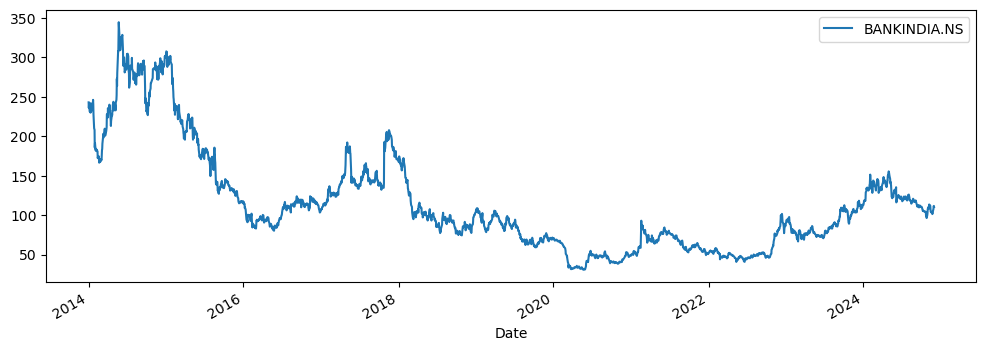

In [30]:
for t in tickers:
    bank_stocks[t]['Close'].plot(figsize=(12,4),label=t)
plt.legend()

In [34]:
bank_stocks.xs(key='Close',axis=1,level='Price').iplot()

In [36]:
bank_stocks.xs(key='Open',axis=1,level='Price').iplot()

In [37]:
bank_stocks.xs(key='Low',axis=1,level='Price').iplot()

In [38]:
bank_stocks.xs(key='High',axis=1,level='Price').iplot()

## Moving Averages

In [54]:
plt.figure(figsize=(12,6))
#bank_stocks.xs(key= 'Close',axis= 1,level= 'Price').rolling(20).mean().iplot()
#bank_stocks.xs(key= 'Close',axis= 1,level= 'Price').iplot()
#bank_stocks.loc['2024,1,1':'2024,11,30'].rolling(20).mean().iplot()
bank_stocks.xs(key= 'Close',axis= 1,level= 'Price').loc['2024,1,1':'2024,11,30'].iplot()
plt.legend()

TypeError: cannot do slice indexing on DatetimeIndex with these indexers [2024,1,1] of type str

<Figure size 1200x600 with 0 Axes>

C:\Users\Palak Kapahi\AppData\Local\Temp\ipykernel_18448\2280733332.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='ICICIBANK.NSreturn', ylabel='Density'>

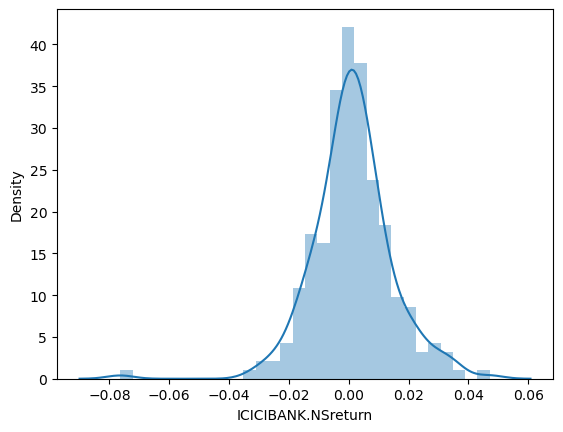

In [65]:
plt.figure(figsize=(12,6))
bank_stocks.xs(key= 'Close',axis= 1,level= 'Price').loc['2024-01-1':'2024-11-30'].rolling(20).mean().iplot()
bank_stocks.xs(key= 'Close',axis= 1, level= 'Price').loc['2024-01-1':'2024-11-30'].iplot()

<Figure size 1200x600 with 0 Axes>

In [58]:
'''
bank_stocks.index = pd.to_datetime(bank_stocks.index)
data = bank_stocks.xs(key='Close', axis=1, level='Price').loc['2024-01-01':'2024-11-30'] 
print(data)
'''

In [69]:
plt.figure(figsize=(12,6))
HDFCBANK['Close'].loc['2024-01-1':'2024-11-30'].rolling(20).mean().iplot()
HDFCBANK['Close'].loc['2024-01-1':'2024-11-30'].iplot()

<Figure size 1200x600 with 0 Axes>

<Axes: xlabel='None-Ticker', ylabel='None-Ticker'>

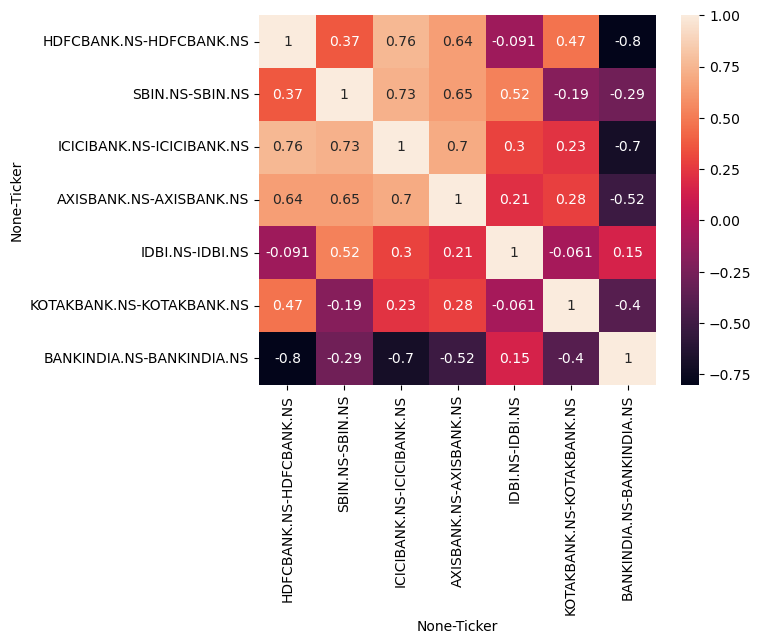

In [70]:
sns.heatmap(bank_stocks.xs(key= 'Close',axis= 1,level= 'Price').loc['2024-01-1':'2024-11-30'].corr(), annot=True)

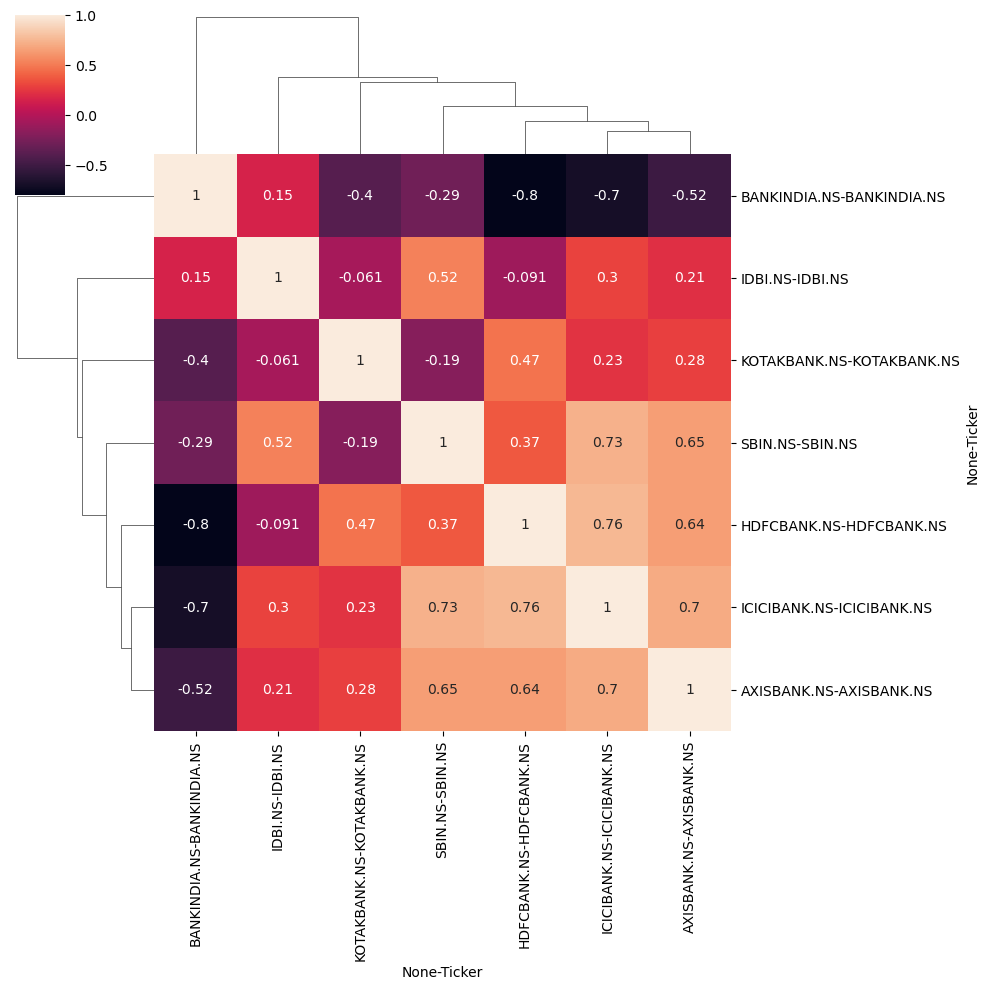

In [71]:
sns.clustermap(bank_stocks.xs(key= 'Close',axis= 1,level= 'Price').loc['2024-01-1':'2024-11-30'].corr(),annot=True)

In [78]:
close_corr = bank_stocks.xs(key='Close',axis=1,level='Price').corr()

In [79]:
close_corr.iplot(kind='heatmap')

In [77]:
bank_stocks.xs(key='Close',axis=1,level='Price').iplot(kind='spread')


C:\Users\Palak Kapahi\anaconda3\lib\site-packages\cufflinks\plotlytools.py:850: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead.



In [92]:
import plotly.graph_objs as go 
from plotly.subplots import make_subplots
fig = go.Figure(data=[go.Candlestick(open=SBI['Open'], high=SBI['High'], low=SBI['Low'], close=SBI['Close'])])
fig.show()

### Simple Moving Averages plot using technical analysis plot

In [95]:
HDFCBANK.xs(key='Close',axis=1,level='Price').loc['2024-01-01':'2024-11-30'].ta_plot(study='sma',title='Simple Moving Averages')

### Bollinger Band plot - 
1. What are Bollinger Bands?

--> Bollinger Bands are a technical analysis tool used to understand market volatility and potential price movements. They consist of three lines: the middle line (a moving average) and two outer lines (bands) that move above and below the moving average.

2. When Bands Tighten:

--> If the bands come close together, it means the market is calm with low volatility. This tightening usually suggests that a sharp price move might happen soon, either up or down.

3. False Moves:

--> Sometimes, prices might briefly move in one direction but then reverse. This false move can happen before the actual trend starts.

4. When Bands Widen:

--> If the bands spread far apart, it indicates high volatility. This could mean that the current trend might be coming to an end.

5. Price Bouncing Between Bands:

--> Prices often move within the space between the upper and lower bands, bouncing from one to the other.

--> Traders use this to set potential profit targets. For instance, if the price hits the lower band and then crosses above the moving average, the upper band becomes the target to sell for profit.

6. Price Hugging a Band:

--> During strong trends, prices can stay close to one of the bands for a long time. When this happens, traders might need to look at other indicators (like momentum oscillators) to decide whether to take more profits.

7. Moving Outside the Bands:

--> If the price moves outside the bands, it suggests the trend is strong. However, if the price quickly moves back inside the bands, it could mean the trend isn't as strong as it appeared.

In [97]:
HDFCBANK.xs(key='Close',axis=1,level='Price').loc['2024-01-01':'2024-11-30'].ta_plot(study='boll')